In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
from sklearn.preprocessing import MinMaxScaler
from datetime import date, timedelta
from sklearn.metrics import mean_squared_error
import tensorflow.keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import LSTM

In [3]:
df= pd.read_csv('dataset\main\eMARC load blocks.csv')
df

,deployment_id,block,date,Load (kW)
0,D0020,35,2/3/2018,0.113429
1,D0020,35,2/22/2018,0.017000
2,D0020,35,3/4/2018,0.162748
3,D0020,35,3/5/2018,0.784350
4,D0020,35,3/13/2018,0.114382
...,...,...,...,...
12702796,D0271,95,9/30/2019,0.027400
12702797,D0271,95,2/18/2020,0.012333
12702798,D0272,95,12/19/2019,0.008533
12702799,D0272,95,5/9/2020,0.034667


In [4]:
df['Year']=pd.DatetimeIndex(df['date']).year

In [5]:
df

,deployment_id,block,date,Load (kW),Year
0,D0020,35,2/3/2018,0.113429,2018
1,D0020,35,2/22/2018,0.017000,2018
2,D0020,35,3/4/2018,0.162748,2018
3,D0020,35,3/5/2018,0.784350,2018
4,D0020,35,3/13/2018,0.114382,2018
...,...,...,...,...,...
12702796,D0271,95,9/30/2019,0.027400,2019
12702797,D0271,95,2/18/2020,0.012333,2020
12702798,D0272,95,12/19/2019,0.008533,2019
12702799,D0272,95,5/9/2020,0.034667,2020


In [6]:
df=df.groupby('Year').get_group(2019)

In [7]:
df = df.reset_index()
df.drop(['index','Year'],axis=1,inplace=True)

In [8]:
df

,deployment_id,block,date,Load (kW)
0,D0001,0,6/16/2019,0.000000
1,D0001,0,7/30/2019,0.036022
2,D0001,0,8/3/2019,0.072050
3,D0002,0,3/8/2019,0.000000
4,D0002,0,7/18/2019,0.043624
...,...,...,...,...
6315197,D0270,95,10/9/2019,0.267667
6315198,D0271,95,7/15/2019,0.010267
6315199,D0271,95,8/10/2019,0.033933
6315200,D0271,95,9/30/2019,0.027400


In [9]:
df1= pd.read_csv('dataset\main\Household-Deployment basic info.csv')
df1.head()

,deployment_id,household_id,Deployment type,Region,Household type
0,D0001,H001,appliance,Pune city,Basic
1,D0002,H001,Mainline,Pune city,Basic
2,D0003,H002,appliance,Pune city,With Air Conditioners
3,D0004,H002,Mainline,Pune city,With Air Conditioners
4,D0005,H003,appliance,Pune city,Water Heaters but no AC


In [10]:
df1 = df1.groupby('Deployment type').get_group('Mainline')
df1

,deployment_id,household_id,Deployment type,Region,Household type
1,D0002,H001,Mainline,Pune city,Basic
3,D0004,H002,Mainline,Pune city,With Air Conditioners
5,D0006,H003,Mainline,Pune city,Water Heaters but no AC
7,D0008,H004,Mainline,Pune city,Water Heaters but no AC
9,D0010,H005,Mainline,Pune city,With Air Conditioners
...,...,...,...,...,...
261,D0262,H140,Mainline,Aurangabad,Basic
263,D0264,H141,Mainline,Aurangabad,Basic
265,D0266,H142,Mainline,Aurangabad,Water Heaters but no AC
267,D0268,H143,Mainline,Aurangabad,With Air Conditioners


In [11]:
df1 = df1.groupby('Region').get_group('Pune city')
df1

,deployment_id,household_id,Deployment type,Region,Household type
1,D0002,H001,Mainline,Pune city,Basic
3,D0004,H002,Mainline,Pune city,With Air Conditioners
5,D0006,H003,Mainline,Pune city,Water Heaters but no AC
7,D0008,H004,Mainline,Pune city,Water Heaters but no AC
9,D0010,H005,Mainline,Pune city,With Air Conditioners
11,D0012,H006,Mainline,Pune city,Basic
13,D0014,H007,Mainline,Pune city,Water Heaters but no AC
15,D0016,H008,Mainline,Pune city,Basic
16,D0017,H009,Mainline,Pune city,Basic
19,D0020,H010,Mainline,Pune city,Water Heaters but no AC


In [12]:
df1.drop(['Region','Deployment type','Household type'],axis=1,inplace=True)
df1

C:\Users\Chandra Sekar S\AppData\Local\Temp\ipykernel_4492\3476074006.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1.drop(['Region','Deployment type','Household type'],axis=1,inplace=True)


,deployment_id,household_id
1,D0002,H001
3,D0004,H002
5,D0006,H003
7,D0008,H004
9,D0010,H005
11,D0012,H006
13,D0014,H007
15,D0016,H008
16,D0017,H009
19,D0020,H010


In [13]:
m1 = pd.merge(df, df1, left_on='deployment_id', right_on='deployment_id', how='left')

In [14]:
m1.dropna(axis=0,inplace=True)

In [15]:
m1 = m1.sort_values(by = ['deployment_id','date','block'])

In [16]:
m1 = m1.reset_index()
m1.drop('index',axis=1,inplace=True)

In [17]:
m1

,deployment_id,block,date,Load (kW),household_id
0,D0002,0,1/1/2019,0.100411,H001
1,D0002,1,1/1/2019,0.034718,H001
2,D0002,2,1/1/2019,0.031745,H001
3,D0002,3,1/1/2019,0.028982,H001
4,D0002,4,1/1/2019,0.098618,H001
...,...,...,...,...,...
1384137,D0087,91,9/9/2019,0.165841,H044
1384138,D0087,92,9/9/2019,0.157579,H044
1384139,D0087,93,9/9/2019,0.186886,H044
1384140,D0087,94,9/9/2019,0.122679,H044


In [18]:
df2=pd.read_csv('dataset/main/SurveySummary.csv')
df2.dropna(axis=0,inplace=True)

In [19]:
df2

,House Number,Rooms,No of People,Area (sqft),Inverters,Lights,Ceiling Fans,Air Coolers,Air Conditioners,Water heaters
0,H001,3,3,625.0,0,19,3,0,0,0
1,H002,5,4,1100.0,0,14,5,0,3,1
2,H003,5,2,1000.0,0,16,6,0,0,3
3,H004,3,7,550.0,0,10,2,0,0,1
4,H005,4,5,650.0,0,4,3,0,1,0
5,H007,4,5,700.0,0,4,4,0,0,1
6,H008,4,4,700.0,1,5,4,0,0,0
7,H009,3,4,675.0,1,10,2,0,0,0
8,H010,4,3,1000.0,0,9,4,0,0,2
9,H011,3,3,575.0,0,12,3,1,0,1


In [20]:
df_m = pd.merge(m1, df2, left_on='household_id', right_on='House Number', how='left')
df_m

,deployment_id,block,date,Load (kW),household_id,House Number,Rooms,No of People,Area (sqft),Inverters,Lights,Ceiling Fans,Air Coolers,Air Conditioners,Water heaters
0,D0002,0,1/1/2019,0.100411,H001,H001,3.0,3.0,625.0,0.0,19.0,3.0,0.0,0.0,0.0
1,D0002,1,1/1/2019,0.034718,H001,H001,3.0,3.0,625.0,0.0,19.0,3.0,0.0,0.0,0.0
2,D0002,2,1/1/2019,0.031745,H001,H001,3.0,3.0,625.0,0.0,19.0,3.0,0.0,0.0,0.0
3,D0002,3,1/1/2019,0.028982,H001,H001,3.0,3.0,625.0,0.0,19.0,3.0,0.0,0.0,0.0
4,D0002,4,1/1/2019,0.098618,H001,H001,3.0,3.0,625.0,0.0,19.0,3.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1384137,D0087,91,9/9/2019,0.165841,H044,H044,4.0,2.0,800.0,1.0,9.0,4.0,0.0,0.0,0.0
1384138,D0087,92,9/9/2019,0.157579,H044,H044,4.0,2.0,800.0,1.0,9.0,4.0,0.0,0.0,0.0
1384139,D0087,93,9/9/2019,0.186886,H044,H044,4.0,2.0,800.0,1.0,9.0,4.0,0.0,0.0,0.0
1384140,D0087,94,9/9/2019,0.122679,H044,H044,4.0,2.0,800.0,1.0,9.0,4.0,0.0,0.0,0.0


In [21]:
df_m.dropna(axis=0,inplace=True)

In [22]:
df_m

,deployment_id,block,date,Load (kW),household_id,House Number,Rooms,No of People,Area (sqft),Inverters,Lights,Ceiling Fans,Air Coolers,Air Conditioners,Water heaters
0,D0002,0,1/1/2019,0.100411,H001,H001,3.0,3.0,625.0,0.0,19.0,3.0,0.0,0.0,0.0
1,D0002,1,1/1/2019,0.034718,H001,H001,3.0,3.0,625.0,0.0,19.0,3.0,0.0,0.0,0.0
2,D0002,2,1/1/2019,0.031745,H001,H001,3.0,3.0,625.0,0.0,19.0,3.0,0.0,0.0,0.0
3,D0002,3,1/1/2019,0.028982,H001,H001,3.0,3.0,625.0,0.0,19.0,3.0,0.0,0.0,0.0
4,D0002,4,1/1/2019,0.098618,H001,H001,3.0,3.0,625.0,0.0,19.0,3.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1384137,D0087,91,9/9/2019,0.165841,H044,H044,4.0,2.0,800.0,1.0,9.0,4.0,0.0,0.0,0.0
1384138,D0087,92,9/9/2019,0.157579,H044,H044,4.0,2.0,800.0,1.0,9.0,4.0,0.0,0.0,0.0
1384139,D0087,93,9/9/2019,0.186886,H044,H044,4.0,2.0,800.0,1.0,9.0,4.0,0.0,0.0,0.0
1384140,D0087,94,9/9/2019,0.122679,H044,H044,4.0,2.0,800.0,1.0,9.0,4.0,0.0,0.0,0.0


In [23]:
df_f = (df_m.loc[(df_m['household_id'] == 'H004')|(df_m['household_id'] == 'H007')|(df_m['household_id'] == 'H010')|(df_m['household_id'] == 'H011')|(df_m['household_id'] == 'H012')|(df_m['household_id'] == 'H013')|(df_m['household_id'] == 'H014')|(df_m['household_id'] == 'H018')|(df_m['household_id'] == 'H021')|(df_m['household_id'] == 'H021')|(df_m['household_id'] == 'H022')|(df_m['household_id'] == 'H023')|(df_m['household_id'] == 'H025')|(df_m['household_id'] == 'H026')|(df_m['household_id'] == 'H030')|(df_m['household_id'] == 'H031')|(df_m['household_id'] == 'H032')|(df_m['household_id'] == 'H036')|(df_m['household_id'] == 'H037')|(df_m['household_id'] == 'H040')|(df_m['household_id'] == 'H042')])

In [24]:
df_f

,deployment_id,block,date,Load (kW),household_id,House Number,Rooms,No of People,Area (sqft),Inverters,Lights,Ceiling Fans,Air Coolers,Air Conditioners,Water heaters
94247,D0008,0,1/1/2019,0.203550,H004,H004,3.0,7.0,550.0,0.0,10.0,2.0,0.0,0.0,1.0
94248,D0008,1,1/1/2019,0.204695,H004,H004,3.0,7.0,550.0,0.0,10.0,2.0,0.0,0.0,1.0
94249,D0008,2,1/1/2019,0.143164,H004,H004,3.0,7.0,550.0,0.0,10.0,2.0,0.0,0.0,1.0
94250,D0008,3,1/1/2019,0.140705,H004,H004,3.0,7.0,550.0,0.0,10.0,2.0,0.0,0.0,1.0
94251,D0008,4,1/1/2019,0.045253,H004,H004,3.0,7.0,550.0,0.0,10.0,2.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1315109,D0084,91,9/9/2019,0.306115,H042,H042,5.0,5.0,1700.0,0.0,15.0,7.0,2.0,0.0,1.0
1315110,D0084,92,9/9/2019,0.158254,H042,H042,5.0,5.0,1700.0,0.0,15.0,7.0,2.0,0.0,1.0
1315111,D0084,93,9/9/2019,0.061032,H042,H042,5.0,5.0,1700.0,0.0,15.0,7.0,2.0,0.0,1.0
1315112,D0084,94,9/9/2019,0.066471,H042,H042,5.0,5.0,1700.0,0.0,15.0,7.0,2.0,0.0,1.0


In [25]:
df_f = df_f.reset_index()
df_f.drop('index',axis=1,inplace=True)

In [26]:
df_f['Day']=pd.to_datetime(df_f['date']).dt.dayofweek

In [27]:
df_f

,deployment_id,block,date,Load (kW),household_id,House Number,Rooms,No of People,Area (sqft),Inverters,Lights,Ceiling Fans,Air Coolers,Air Conditioners,Water heaters,Day
0,D0008,0,1/1/2019,0.203550,H004,H004,3.0,7.0,550.0,0.0,10.0,2.0,0.0,0.0,1.0,1
1,D0008,1,1/1/2019,0.204695,H004,H004,3.0,7.0,550.0,0.0,10.0,2.0,0.0,0.0,1.0,1
2,D0008,2,1/1/2019,0.143164,H004,H004,3.0,7.0,550.0,0.0,10.0,2.0,0.0,0.0,1.0,1
3,D0008,3,1/1/2019,0.140705,H004,H004,3.0,7.0,550.0,0.0,10.0,2.0,0.0,0.0,1.0,1
4,D0008,4,1/1/2019,0.045253,H004,H004,3.0,7.0,550.0,0.0,10.0,2.0,0.0,0.0,1.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
595715,D0084,91,9/9/2019,0.306115,H042,H042,5.0,5.0,1700.0,0.0,15.0,7.0,2.0,0.0,1.0,0
595716,D0084,92,9/9/2019,0.158254,H042,H042,5.0,5.0,1700.0,0.0,15.0,7.0,2.0,0.0,1.0,0
595717,D0084,93,9/9/2019,0.061032,H042,H042,5.0,5.0,1700.0,0.0,15.0,7.0,2.0,0.0,1.0,0
595718,D0084,94,9/9/2019,0.066471,H042,H042,5.0,5.0,1700.0,0.0,15.0,7.0,2.0,0.0,1.0,0


In [28]:
df_f.drop(['deployment_id','date','household_id','House Number'],axis=1,inplace=True)

In [29]:
df_f = df_f.loc[:,['Load (kW)','block','Day','Area (sqft)','Rooms','No of People','Inverters','Lights','Ceiling Fans','Air Coolers','Air Conditioners','Water heaters']]

In [30]:
df_f

,Load (kW),block,Day,Area (sqft),Rooms,No of People,Inverters,Lights,Ceiling Fans,Air Coolers,Air Conditioners,Water heaters
0,0.203550,0,1,550.0,3.0,7.0,0.0,10.0,2.0,0.0,0.0,1.0
1,0.204695,1,1,550.0,3.0,7.0,0.0,10.0,2.0,0.0,0.0,1.0
2,0.143164,2,1,550.0,3.0,7.0,0.0,10.0,2.0,0.0,0.0,1.0
3,0.140705,3,1,550.0,3.0,7.0,0.0,10.0,2.0,0.0,0.0,1.0
4,0.045253,4,1,550.0,3.0,7.0,0.0,10.0,2.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...
595715,0.306115,91,0,1700.0,5.0,5.0,0.0,15.0,7.0,2.0,0.0,1.0
595716,0.158254,92,0,1700.0,5.0,5.0,0.0,15.0,7.0,2.0,0.0,1.0
595717,0.061032,93,0,1700.0,5.0,5.0,0.0,15.0,7.0,2.0,0.0,1.0
595718,0.066471,94,0,1700.0,5.0,5.0,0.0,15.0,7.0,2.0,0.0,1.0


In [31]:
df_f['block']=pd.to_numeric(df_f['block'],errors='coerce')
df_f['Load (kW)']=pd.to_numeric(df_f['Load (kW)'], errors='coerce')
df_f['Rooms']=pd.to_numeric(df_f['Rooms'], errors='coerce')
df_f['No of People']=pd.to_numeric(df_f['No of People'], errors='coerce')
df_f['Area (sqft)']=pd.to_numeric(df_f['Area (sqft)'], errors='coerce')
df_f['Inverters']=pd.to_numeric(df_f['Inverters'], errors='coerce')
df_f['Lights']=pd.to_numeric(df_f['Lights'], errors='coerce')
df_f['Ceiling Fans']=pd.to_numeric(df_f['Ceiling Fans'], errors='coerce')
df_f['Air Coolers']=pd.to_numeric(df_f['Air Coolers'], errors='coerce')
df_f['Air Conditioners']=pd.to_numeric(df_f['Air Conditioners'], errors='coerce')
df_f['Water heaters']=pd.to_numeric(df_f['Water heaters'], errors='coerce')
df_f['Day']=pd.to_numeric(df_f['Day'], errors='coerce')

In [32]:
df_f

,Load (kW),block,Day,Area (sqft),Rooms,No of People,Inverters,Lights,Ceiling Fans,Air Coolers,Air Conditioners,Water heaters
0,0.203550,0,1,550.0,3.0,7.0,0.0,10.0,2.0,0.0,0.0,1.0
1,0.204695,1,1,550.0,3.0,7.0,0.0,10.0,2.0,0.0,0.0,1.0
2,0.143164,2,1,550.0,3.0,7.0,0.0,10.0,2.0,0.0,0.0,1.0
3,0.140705,3,1,550.0,3.0,7.0,0.0,10.0,2.0,0.0,0.0,1.0
4,0.045253,4,1,550.0,3.0,7.0,0.0,10.0,2.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...
595715,0.306115,91,0,1700.0,5.0,5.0,0.0,15.0,7.0,2.0,0.0,1.0
595716,0.158254,92,0,1700.0,5.0,5.0,0.0,15.0,7.0,2.0,0.0,1.0
595717,0.061032,93,0,1700.0,5.0,5.0,0.0,15.0,7.0,2.0,0.0,1.0
595718,0.066471,94,0,1700.0,5.0,5.0,0.0,15.0,7.0,2.0,0.0,1.0


In [33]:
#df_f.drop(['Rooms','Inverters'],axis=1,inplace=True)

In [33]:
scaler = MinMaxScaler(feature_range=(0,1))
df_1=scaler.fit_transform(df_f)
df_scaled = pd.DataFrame(df_1,columns=df_f.columns)
df_scaled

,Load (kW),block,Day,Area (sqft),Rooms,No of People,Inverters,Lights,Ceiling Fans,Air Coolers,Air Conditioners,Water heaters
0,0.041223,0.000000,0.166667,0.041667,0.0,1.0,0.0,0.3750,0.0,0.0,0.0,0.333333
1,0.041455,0.010526,0.166667,0.041667,0.0,1.0,0.0,0.3750,0.0,0.0,0.0,0.333333
2,0.028994,0.021053,0.166667,0.041667,0.0,1.0,0.0,0.3750,0.0,0.0,0.0,0.333333
3,0.028496,0.031579,0.166667,0.041667,0.0,1.0,0.0,0.3750,0.0,0.0,0.0,0.333333
4,0.009165,0.042105,0.166667,0.041667,0.0,1.0,0.0,0.3750,0.0,0.0,0.0,0.333333
...,...,...,...,...,...,...,...,...,...,...,...,...
595715,0.061995,0.957895,0.000000,1.000000,1.0,0.6,0.0,0.6875,1.0,1.0,0.0,0.333333
595716,0.032050,0.968421,0.000000,1.000000,1.0,0.6,0.0,0.6875,1.0,1.0,0.0,0.333333
595717,0.012360,0.978947,0.000000,1.000000,1.0,0.6,0.0,0.6875,1.0,1.0,0.0,0.333333
595718,0.013462,0.989474,0.000000,1.000000,1.0,0.6,0.0,0.6875,1.0,1.0,0.0,0.333333


In [34]:
X=df_scaled.drop('Load (kW)',axis=1)
y=df_scaled['Load (kW)']

In [35]:
X = np.asarray(X).astype(np.float32)
y= np.asarray(y).astype(np.float32)

In [36]:
df_scaled.isnull().sum()

Load (kW)           0
block               0
Day                 0
Area (sqft)         0
Rooms               0
No of People        0
Inverters           0
Lights              0
Ceiling Fans        0
Air Coolers         0
Air Conditioners    0
Water heaters       0
dtype: int64

In [37]:
training_size=int(len(df_scaled)*0.90)
test_size=len(df_scaled)-training_size
X_train,y_train,X_test,y_test=df_scaled.iloc[0:training_size,1:13],df_scaled.iloc[0:training_size,0],df_scaled.iloc[training_size:len(df_scaled),1:13],df_scaled.iloc[training_size:len(df_scaled),0]
X_train=X_train.to_numpy()
y_train=y_train.to_numpy()
X_test=X_test.to_numpy()
y_test=y_test.to_numpy()
print(X_train.shape,y_train.shape,X_test.shape,y_test.shape)

(536148, 11) (536148,) (59572, 11) (59572,)


In [38]:
X_train = X_train.reshape(X_train.shape[0], 1, X_train.shape[1])
X_test  = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])

In [39]:
X_test

array([[[0.31578947, 1.        , 0.5       , ..., 0.        ,
         1.        , 0.33333333]],

       [[0.32631579, 1.        , 0.5       , ..., 0.        ,
         1.        , 0.33333333]],

       [[0.33684211, 1.        , 0.5       , ..., 0.        ,
         1.        , 0.33333333]],

       ...,

       [[0.97894737, 0.        , 1.        , ..., 1.        ,
         0.        , 0.33333333]],

       [[0.98947368, 0.        , 1.        , ..., 1.        ,
         0.        , 0.33333333]],

       [[1.        , 0.        , 1.        , ..., 1.        ,
         0.        , 0.33333333]]])

In [40]:
model1=Sequential()
model1.add(LSTM(50,return_sequences=True,input_shape=(1,11)))
model1.add(LSTM(50))
#model1.dropout(0.5)
model1.add(Dense(1))
model1.compile(loss='mean_squared_error',optimizer='adam')
model1.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 1, 50)             12400     
                                                                 
 lstm_1 (LSTM)               (None, 50)                20200     
                                                                 
 dense (Dense)               (None, 1)                 51        
                                                                 
Total params: 32,651
Trainable params: 32,651
Non-trainable params: 0
_________________________________________________________________


In [41]:
model_history=model1.fit(X_train, y_train, batch_size = 128,epochs = 50, validation_data=(X_test,y_test),verbose=1)

Epoch 1/50
4189/4189 [==============================] - 28s 5ms/step - loss: 0.0051 - val_loss: 0.0099
Epoch 2/50
4189/4189 [==============================] - 19s 5ms/step - loss: 0.0049 - val_loss: 0.0102
Epoch 3/50
4189/4189 [==============================] - 19s 5ms/step - loss: 0.0047 - val_loss: 0.0096
Epoch 4/50
4189/4189 [==============================] - 19s 4ms/step - loss: 0.0045 - val_loss: 0.0104
Epoch 5/50
4189/4189 [==============================] - 19s 5ms/step - loss: 0.0044 - val_loss: 0.0102
Epoch 6/50
4189/4189 [==============================] - 19s 5ms/step - loss: 0.0044 - val_loss: 0.0099
Epoch 7/50
4189/4189 [==============================] - 19s 4ms/step - loss: 0.0043 - val_loss: 0.0090
Epoch 8/50
4189/4189 [==============================] - 19s 5ms/step - loss: 0.0043 - val_loss: 0.0091
Epoch 9/50
4189/4189 [==============================] - 19s 5ms/step - loss: 0.0043 - val_loss: 0.0088
Epoch 10/50
4189/4189 [==============================] - 20s 5ms/step - l

In [42]:
#model1.save('model1')

INFO:tensorflow:Assets written to: model1\assets


INFO:tensorflow:Assets written to: model1\assets


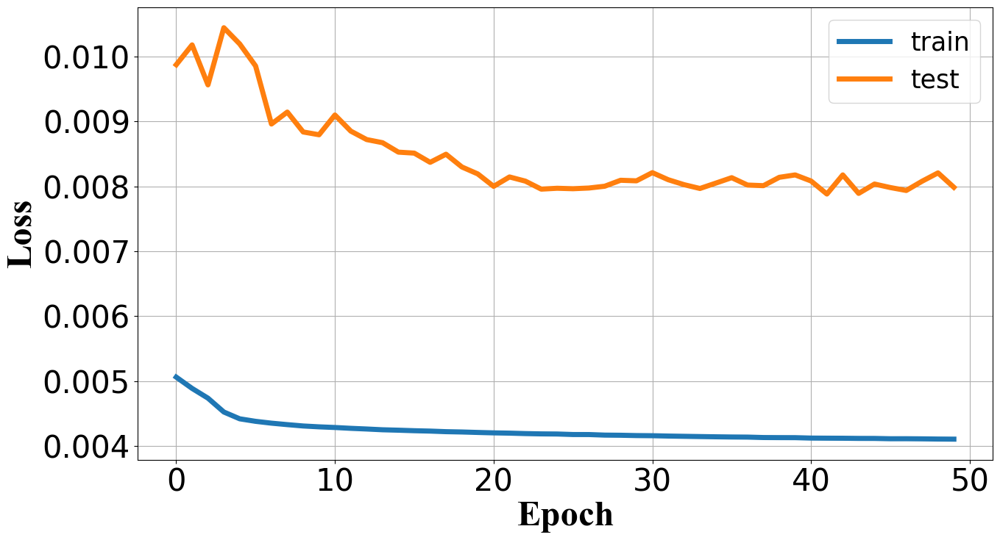

In [43]:
plt.figure(figsize=(15,8))
plt.plot(model_history.history['loss'],linewidth=5)
plt.plot(model_history.history['val_loss'],linewidth=5)
#plt.title('Model loss',fontsize=35,fontname="Times New Roman",fontweight="bold")
plt.ylabel('Loss',fontsize=35,fontname="Times New Roman",fontweight="bold")
plt.xlabel('Epoch',fontsize=35,fontname="Times New Roman",fontweight="bold")
plt.legend(['train', 'test'], loc='upper right',fontsize=25)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.grid()
#plt.savefig('H_Model.png')
#plt.savefig('H_Model.pdf')
plt.show()

In [44]:
size = df_scaled.shape[1]

In [45]:
size

12

In [46]:
X_test.shape

(59572, 1, 11)

In [47]:
yhat = model1.predict(X_test)

1862/1862 [==============================] - 5s 2ms/step


In [48]:
rmse = np.sqrt(mean_squared_error(y_test, yhat))
print('Test RMSE: %.3f' % rmse)

Test RMSE: 0.089


In [49]:
X_test = X_test.reshape(X_test.shape[0], X_test.shape[2])

In [50]:
yhat.shape

(59572, 1)

In [51]:
inv_yhat = np.concatenate((yhat, X_test[:, 1-size:]), axis=1)
inv_yhat = scaler.inverse_transform(inv_yhat)
inv_yhat = inv_yhat[:,0]
inv_yhat.shape

(59572,)

In [52]:
# invert scaling for actual
y_test = y_test.reshape((len(y_test), 1))
inv_y = np.concatenate((y_test, X_test[:, 1-size:]), axis=1)
inv_y = scaler.inverse_transform(inv_y)
inv_y = inv_y[:,0]
inv_y.shape

(59572,)

In [53]:
rmse = np.sqrt(mean_squared_error(inv_y, inv_yhat))
print('Test RMSE: %.3f' % rmse)

Test RMSE: 0.441


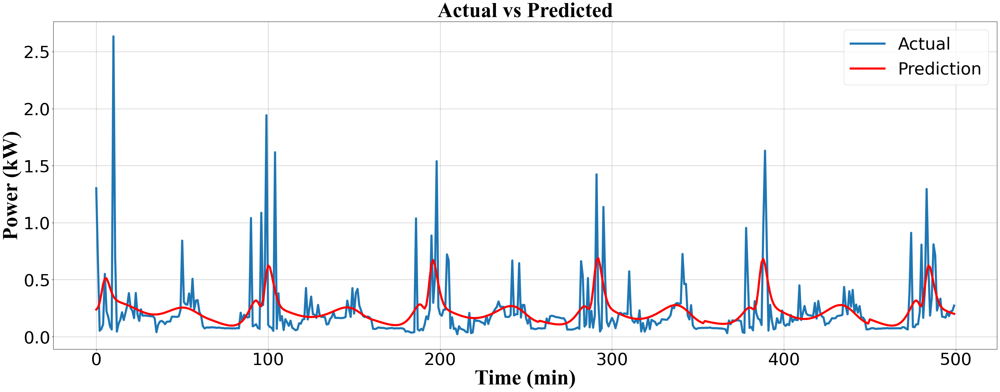

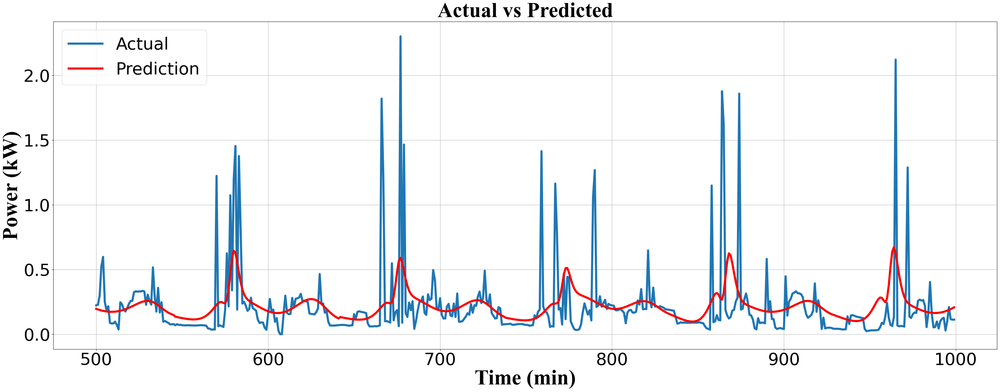

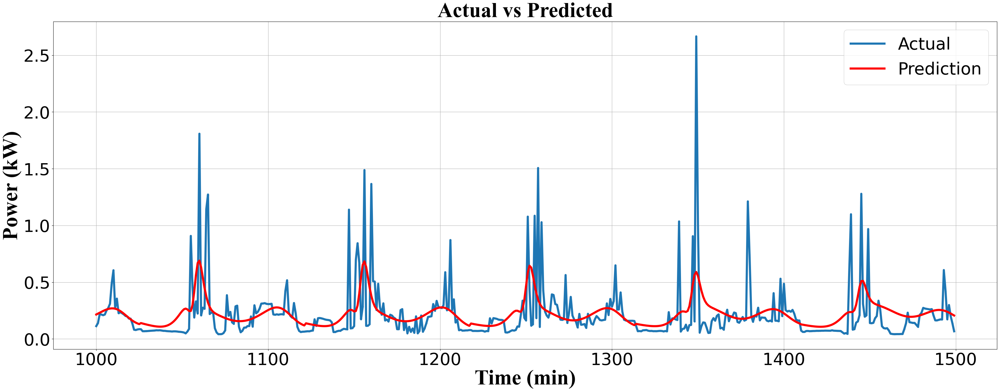

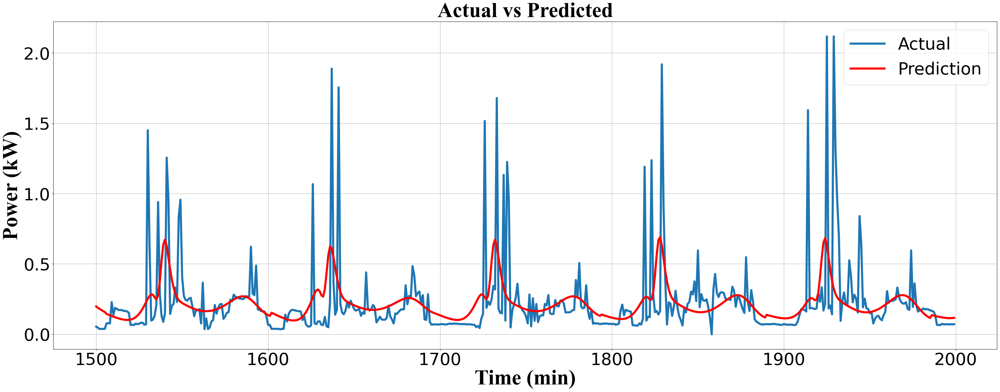

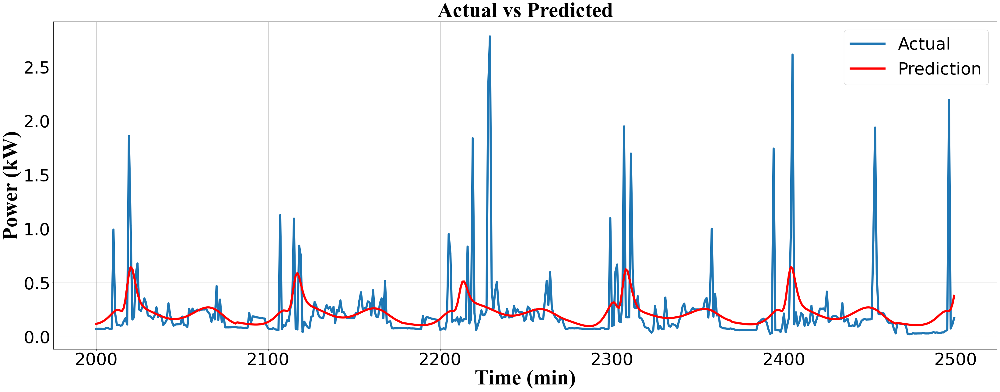

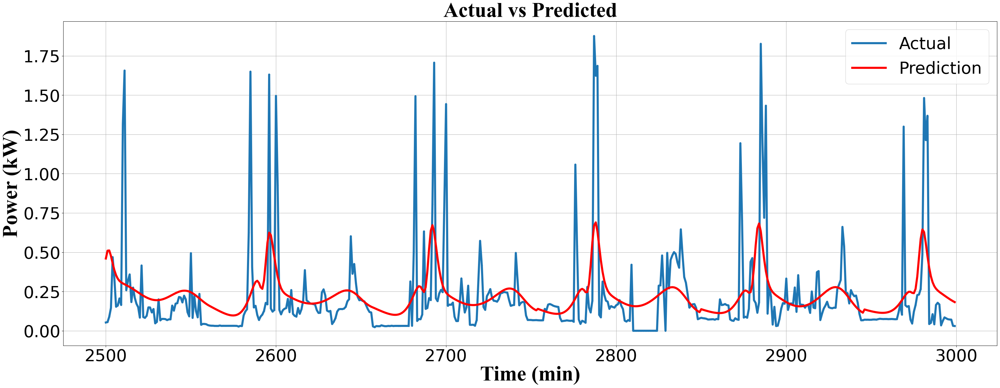

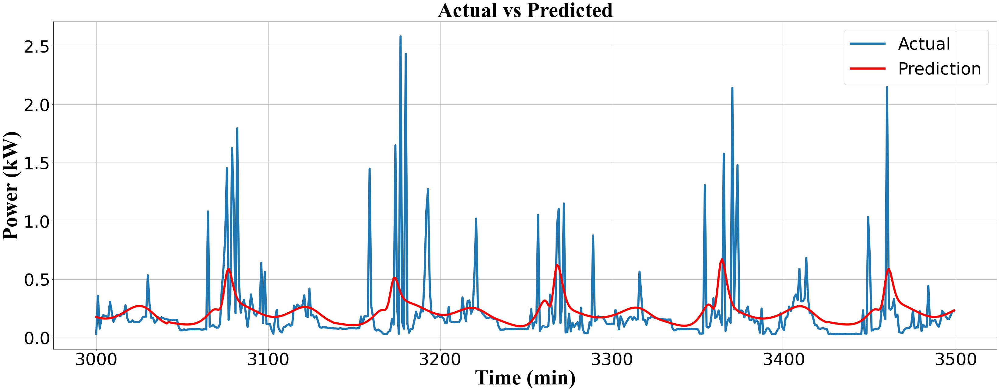

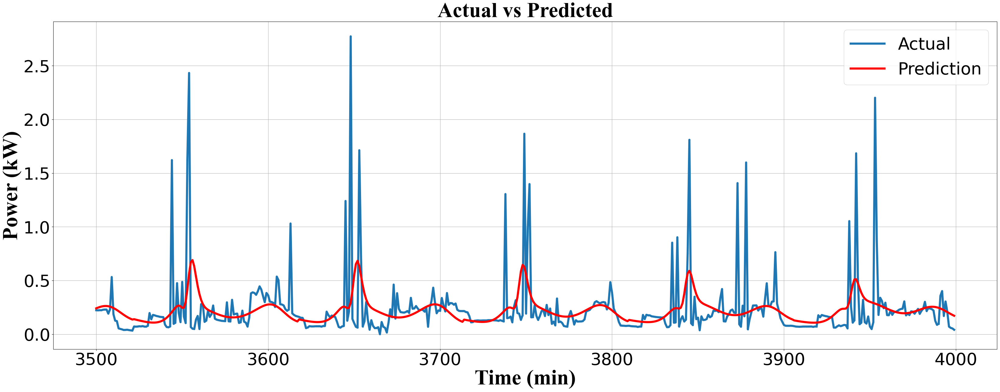

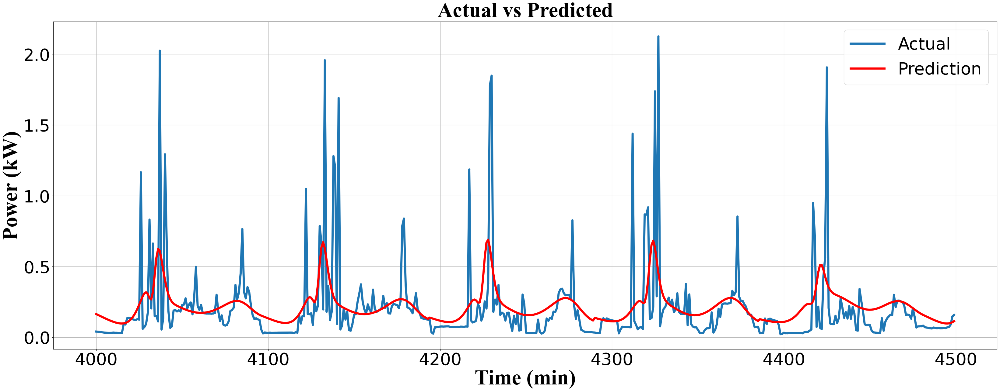

In [54]:
y=0
for i in range(500,5000,500):
    aa=[x for x in range(y,i)]
    plt.figure(figsize=(40,14)) 
    plt.plot(aa, inv_y[y:i], marker='.', label="Actual",linewidth=5 )
    plt.plot(aa, inv_yhat[y:i], 'r', label="Prediction",linewidth=5)
    y = i
    plt.title('Actual vs Predicted', size=50,fontname="Times New Roman",fontweight="bold")
    plt.ylabel('Power (kW)', size=50,fontname="Times New Roman",fontweight="bold")
    plt.xlabel('Time (min)', size=50,fontname="Times New Roman",fontweight="bold")
    plt.legend(fontsize=40)
    plt.xticks(fontsize=40)
    plt.yticks(fontsize=40)
    plt.grid()
  #  plt.savefig('H_pred.pdf')
  #  plt.savefig('H_pred.png')
    plt.show()

In [55]:
df_h16 = df_m.groupby('household_id').get_group('H041')

In [56]:
df_h16 = df_h16.reset_index()
df_h16.drop('index',axis=1,inplace=True)

In [57]:
df_h16

,deployment_id,block,date,Load (kW),household_id,House Number,Rooms,No of People,Area (sqft),Inverters,Lights,Ceiling Fans,Air Coolers,Air Conditioners,Water heaters
0,D0082,0,1/1/2019,0.202814,H041,H041,4.0,5.0,750.0,1.0,15.0,5.0,0.0,1.0,0.0
1,D0082,1,1/1/2019,0.126932,H041,H041,4.0,5.0,750.0,1.0,15.0,5.0,0.0,1.0,0.0
2,D0082,2,1/1/2019,0.168712,H041,H041,4.0,5.0,750.0,1.0,15.0,5.0,0.0,1.0,0.0
3,D0082,3,1/1/2019,0.092398,H041,H041,4.0,5.0,750.0,1.0,15.0,5.0,0.0,1.0,0.0
4,D0082,4,1/1/2019,0.052039,H041,H041,4.0,5.0,750.0,1.0,15.0,5.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34512,D0082,91,9/9/2019,0.398822,H041,H041,4.0,5.0,750.0,1.0,15.0,5.0,0.0,1.0,0.0
34513,D0082,92,9/9/2019,0.460107,H041,H041,4.0,5.0,750.0,1.0,15.0,5.0,0.0,1.0,0.0
34514,D0082,93,9/9/2019,0.334751,H041,H041,4.0,5.0,750.0,1.0,15.0,5.0,0.0,1.0,0.0
34515,D0082,94,9/9/2019,0.203485,H041,H041,4.0,5.0,750.0,1.0,15.0,5.0,0.0,1.0,0.0


In [58]:
df_h16['Day'] = pd.to_datetime(df_h16['date']).dt.dayofweek

In [59]:
df_h16

,deployment_id,block,date,Load (kW),household_id,House Number,Rooms,No of People,Area (sqft),Inverters,Lights,Ceiling Fans,Air Coolers,Air Conditioners,Water heaters,Day
0,D0082,0,1/1/2019,0.202814,H041,H041,4.0,5.0,750.0,1.0,15.0,5.0,0.0,1.0,0.0,1
1,D0082,1,1/1/2019,0.126932,H041,H041,4.0,5.0,750.0,1.0,15.0,5.0,0.0,1.0,0.0,1
2,D0082,2,1/1/2019,0.168712,H041,H041,4.0,5.0,750.0,1.0,15.0,5.0,0.0,1.0,0.0,1
3,D0082,3,1/1/2019,0.092398,H041,H041,4.0,5.0,750.0,1.0,15.0,5.0,0.0,1.0,0.0,1
4,D0082,4,1/1/2019,0.052039,H041,H041,4.0,5.0,750.0,1.0,15.0,5.0,0.0,1.0,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34512,D0082,91,9/9/2019,0.398822,H041,H041,4.0,5.0,750.0,1.0,15.0,5.0,0.0,1.0,0.0,0
34513,D0082,92,9/9/2019,0.460107,H041,H041,4.0,5.0,750.0,1.0,15.0,5.0,0.0,1.0,0.0,0
34514,D0082,93,9/9/2019,0.334751,H041,H041,4.0,5.0,750.0,1.0,15.0,5.0,0.0,1.0,0.0,0
34515,D0082,94,9/9/2019,0.203485,H041,H041,4.0,5.0,750.0,1.0,15.0,5.0,0.0,1.0,0.0,0


In [60]:
df_h16.drop(['deployment_id','date','household_id','House Number'],axis=1,inplace=True)

In [61]:
df_h16

,block,Load (kW),Rooms,No of People,Area (sqft),Inverters,Lights,Ceiling Fans,Air Coolers,Air Conditioners,Water heaters,Day
0,0,0.202814,4.0,5.0,750.0,1.0,15.0,5.0,0.0,1.0,0.0,1
1,1,0.126932,4.0,5.0,750.0,1.0,15.0,5.0,0.0,1.0,0.0,1
2,2,0.168712,4.0,5.0,750.0,1.0,15.0,5.0,0.0,1.0,0.0,1
3,3,0.092398,4.0,5.0,750.0,1.0,15.0,5.0,0.0,1.0,0.0,1
4,4,0.052039,4.0,5.0,750.0,1.0,15.0,5.0,0.0,1.0,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...
34512,91,0.398822,4.0,5.0,750.0,1.0,15.0,5.0,0.0,1.0,0.0,0
34513,92,0.460107,4.0,5.0,750.0,1.0,15.0,5.0,0.0,1.0,0.0,0
34514,93,0.334751,4.0,5.0,750.0,1.0,15.0,5.0,0.0,1.0,0.0,0
34515,94,0.203485,4.0,5.0,750.0,1.0,15.0,5.0,0.0,1.0,0.0,0


In [62]:
df_h16 = df_h16.loc[:,['Load (kW)','block','Day','Area (sqft)','Rooms','No of People','Inverters','Lights','Ceiling Fans','Air Coolers','Air Conditioners','Water heaters']]

In [63]:
df_h16

,Load (kW),block,Day,Area (sqft),Rooms,No of People,Inverters,Lights,Ceiling Fans,Air Coolers,Air Conditioners,Water heaters
0,0.202814,0,1,750.0,4.0,5.0,1.0,15.0,5.0,0.0,1.0,0.0
1,0.126932,1,1,750.0,4.0,5.0,1.0,15.0,5.0,0.0,1.0,0.0
2,0.168712,2,1,750.0,4.0,5.0,1.0,15.0,5.0,0.0,1.0,0.0
3,0.092398,3,1,750.0,4.0,5.0,1.0,15.0,5.0,0.0,1.0,0.0
4,0.052039,4,1,750.0,4.0,5.0,1.0,15.0,5.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
34512,0.398822,91,0,750.0,4.0,5.0,1.0,15.0,5.0,0.0,1.0,0.0
34513,0.460107,92,0,750.0,4.0,5.0,1.0,15.0,5.0,0.0,1.0,0.0
34514,0.334751,93,0,750.0,4.0,5.0,1.0,15.0,5.0,0.0,1.0,0.0
34515,0.203485,94,0,750.0,4.0,5.0,1.0,15.0,5.0,0.0,1.0,0.0


In [64]:
df_h16['block']=pd.to_numeric(df_h16['block'],errors='coerce')
df_h16['Load (kW)']=pd.to_numeric(df_h16['Load (kW)'], errors='coerce')
df_h16['Rooms']=pd.to_numeric(df_h16['Rooms'], errors='coerce')
df_h16['No of People']=pd.to_numeric(df_h16['No of People'], errors='coerce')
df_h16['Area (sqft)']=pd.to_numeric(df_h16['Area (sqft)'], errors='coerce')
df_h16['Inverters']=pd.to_numeric(df_h16['Inverters'], errors='coerce')
df_h16['Lights']=pd.to_numeric(df_h16['Lights'], errors='coerce')
df_h16['Ceiling Fans']=pd.to_numeric(df_h16['Ceiling Fans'], errors='coerce')
df_h16['Air Coolers']=pd.to_numeric(df_h16['Air Coolers'], errors='coerce')
df_h16['Air Conditioners']=pd.to_numeric(df_h16['Air Conditioners'], errors='coerce')
df_h16['Water heaters']=pd.to_numeric(df_h16['Water heaters'], errors='coerce')
df_h16['Day']=pd.to_numeric(df_h16['Day'], errors='coerce')

In [65]:
#df_h16.drop(['Rooms','Inverters'],axis=1,inplace=True)

In [66]:
df_h16

,Load (kW),block,Day,Area (sqft),Rooms,No of People,Inverters,Lights,Ceiling Fans,Air Coolers,Air Conditioners,Water heaters
0,0.202814,0,1,750.0,4.0,5.0,1.0,15.0,5.0,0.0,1.0,0.0
1,0.126932,1,1,750.0,4.0,5.0,1.0,15.0,5.0,0.0,1.0,0.0
2,0.168712,2,1,750.0,4.0,5.0,1.0,15.0,5.0,0.0,1.0,0.0
3,0.092398,3,1,750.0,4.0,5.0,1.0,15.0,5.0,0.0,1.0,0.0
4,0.052039,4,1,750.0,4.0,5.0,1.0,15.0,5.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
34512,0.398822,91,0,750.0,4.0,5.0,1.0,15.0,5.0,0.0,1.0,0.0
34513,0.460107,92,0,750.0,4.0,5.0,1.0,15.0,5.0,0.0,1.0,0.0
34514,0.334751,93,0,750.0,4.0,5.0,1.0,15.0,5.0,0.0,1.0,0.0
34515,0.203485,94,0,750.0,4.0,5.0,1.0,15.0,5.0,0.0,1.0,0.0


In [67]:
scaler = MinMaxScaler(feature_range=(0,1))
df_1=scaler.fit_transform(df_h16)
df_scaled = pd.DataFrame(df_1,columns=df_h16.columns)
df_scaled

,Load (kW),block,Day,Area (sqft),Rooms,No of People,Inverters,Lights,Ceiling Fans,Air Coolers,Air Conditioners,Water heaters
0,0.097612,0.000000,0.166667,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.061090,0.010526,0.166667,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.081199,0.021053,0.166667,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.044470,0.031579,0.166667,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.025046,0.042105,0.166667,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
34512,0.191948,0.957895,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
34513,0.221443,0.968421,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
34514,0.161111,0.978947,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
34515,0.097934,0.989474,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [68]:
X=df_scaled.drop('Load (kW)',axis=1)
y=df_scaled['Load (kW)']

In [69]:
X = np.asarray(X).astype(np.float32)
y= np.asarray(y).astype(np.float32)

In [76]:
X_te,y_te = df_scaled.iloc[:,1:12],df_scaled.iloc[:,0]

In [77]:
X_te = X_te.to_numpy()
y_te = y_te.to_numpy()

In [78]:
X_te  = X_te.reshape(X_te.shape[0], 1, X_te.shape[1])

In [79]:
size = df_h16.shape[1]

In [80]:
X_te.shape

(34517, 1, 11)

In [81]:
yhat = model1.predict(X_te)

1079/1079 [==============================] - 2s 2ms/step


In [82]:
rmse = np.sqrt(mean_squared_error(y_te, yhat))
print('Test RMSE: %.3f' % rmse)

Test RMSE: 0.168


In [83]:
X_te = X_te.reshape(X_te.shape[0], X_te.shape[2])

In [84]:
inv_yhat = np.concatenate((yhat, X_te[:, 1-size:]), axis=1)
inv_yhat = scaler.inverse_transform(inv_yhat)
inv_yhat = inv_yhat[:,0]
inv_yhat.shape

(34517,)

In [85]:
# invert scaling for actual
y_te = y_te.reshape((len(y_te), 1))
inv_y = np.concatenate((y_te, X_te[:, 1-size:]), axis=1)
inv_y = scaler.inverse_transform(inv_y)
inv_y = inv_y[:,0]
inv_y.shape

(34517,)

In [86]:
rmse = np.sqrt(mean_squared_error(inv_y, inv_yhat))
print('Test RMSE: %.3f' % rmse)

Test RMSE: 0.349


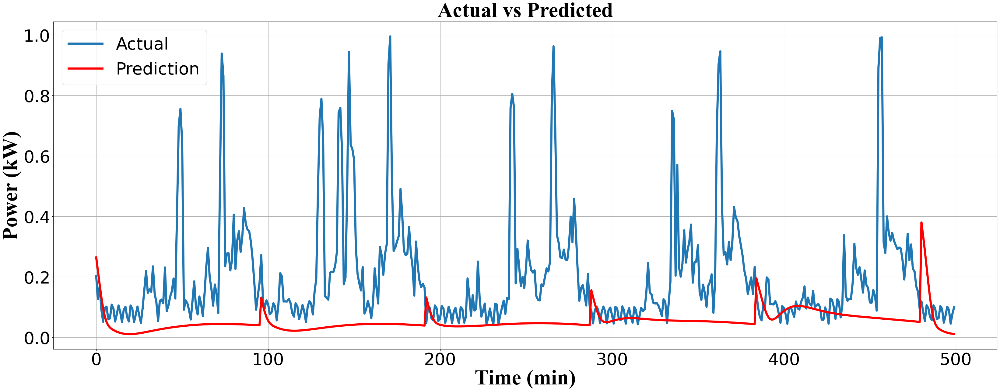

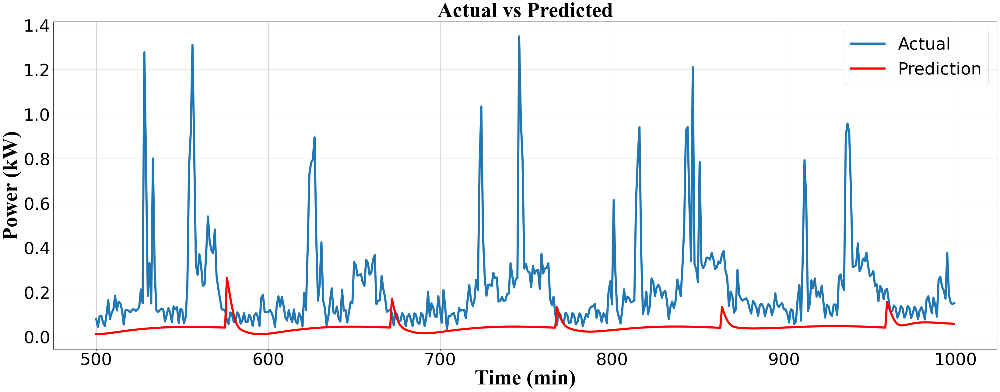

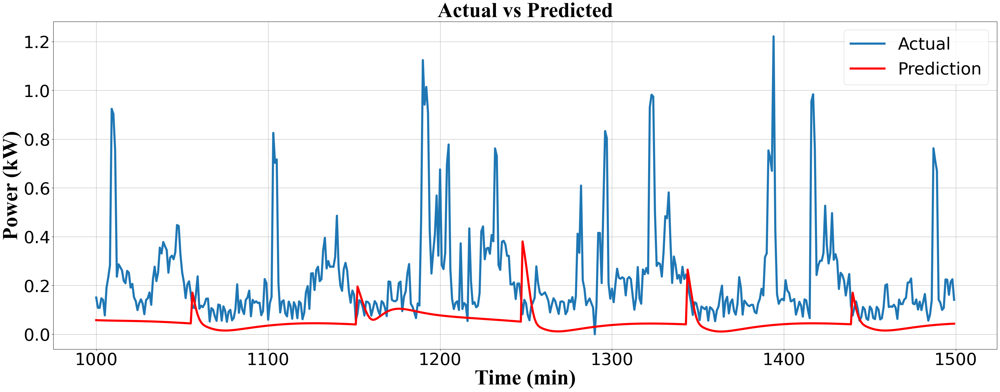

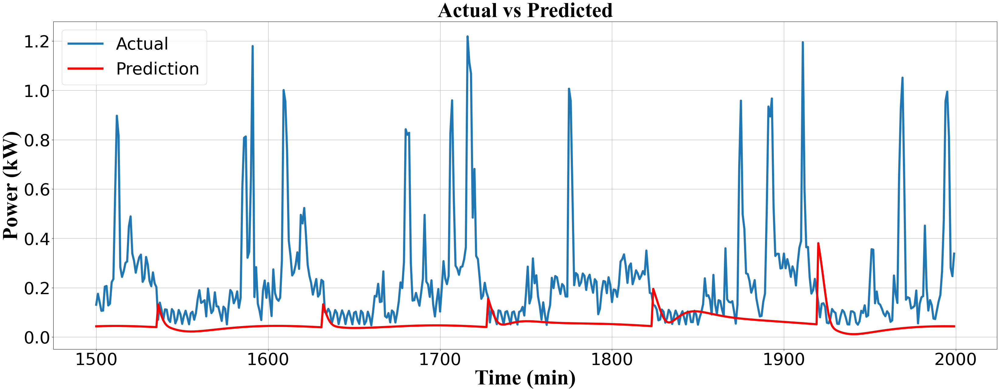

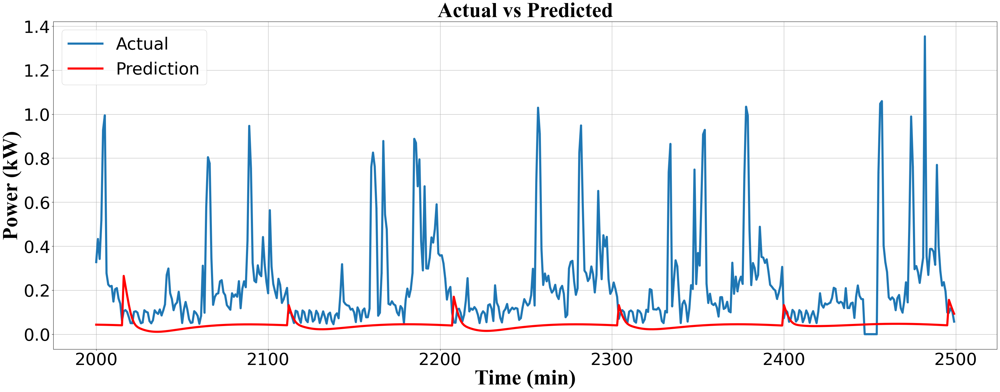

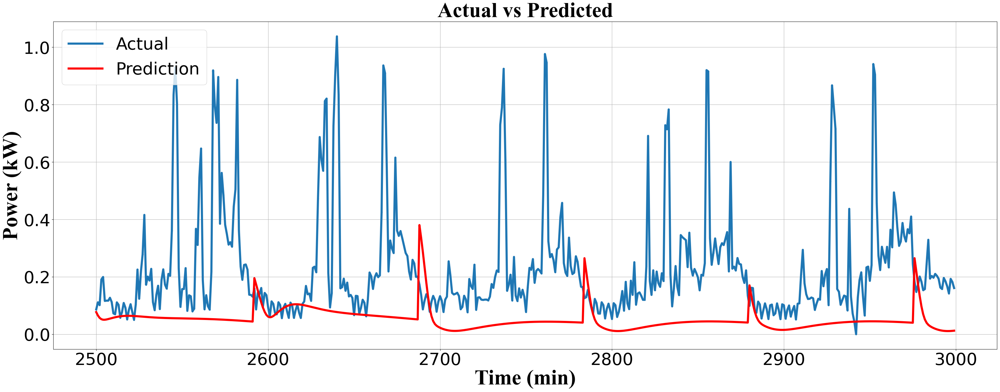

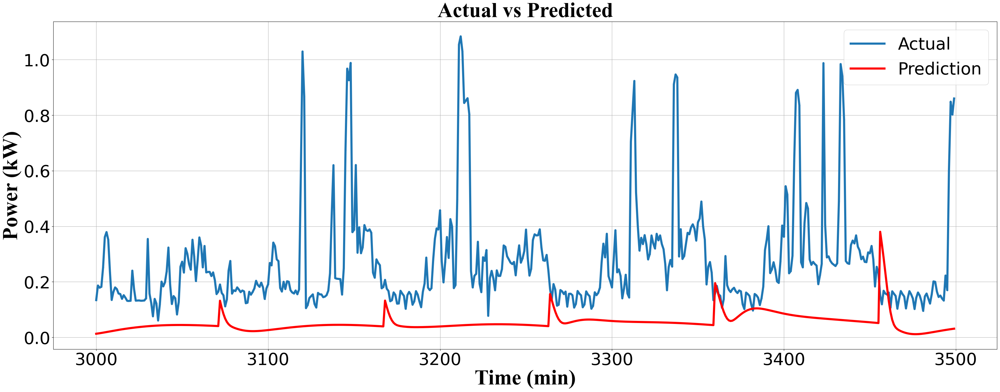

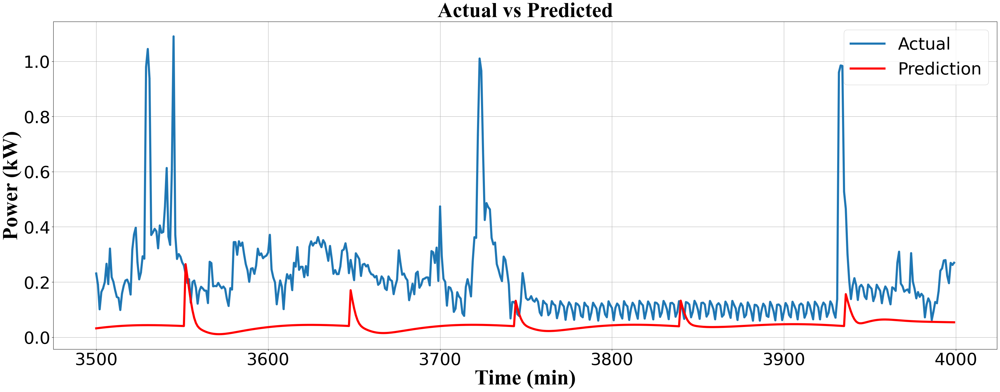

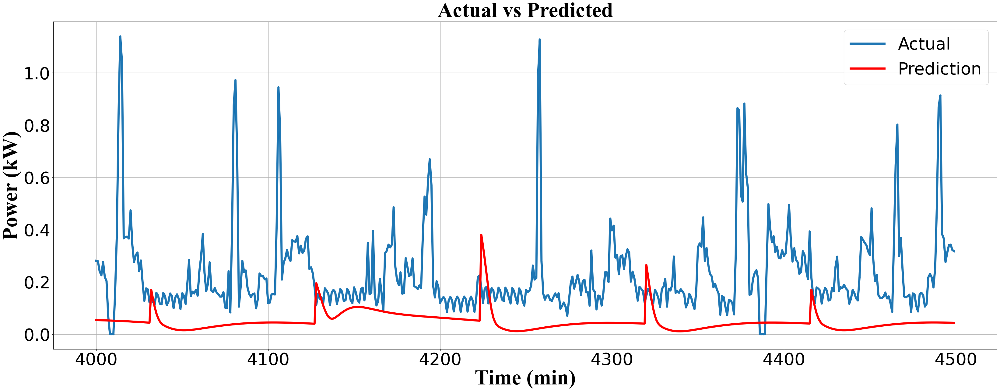

In [87]:
y=0
for i in range(500,5000,500):
    aa=[x for x in range(y,i)]
    plt.figure(figsize=(40,14)) 
    plt.plot(aa, inv_y[y:i], marker='.', label="Actual",linewidth=5 )
    plt.plot(aa, inv_yhat[y:i], 'r', label="Prediction",linewidth=5)
    y = i
    plt.title('Actual vs Predicted', size=50,fontname="Times New Roman",fontweight="bold")
    plt.ylabel('Power (kW)', size=50,fontname="Times New Roman",fontweight="bold")
    plt.xlabel('Time (min)', size=50,fontname="Times New Roman",fontweight="bold")
    plt.legend(fontsize=40)
    plt.xticks(fontsize=40)
    plt.yticks(fontsize=40)
    plt.grid()
  #  plt.savefig('H_pred.pdf')
  #  plt.savefig('H_pred.png')
    plt.show()

In [140]:
df_f

,Load (kW),block,Day,Area (sqft),Rooms,No of People,Inverters,Lights,Ceiling Fans,Air Coolers,Air Conditioners,Water heaters
0,0.203550,0,1,550.0,3.0,7.0,0.0,10.0,2.0,0.0,0.0,1.0
1,0.204695,1,1,550.0,3.0,7.0,0.0,10.0,2.0,0.0,0.0,1.0
2,0.143164,2,1,550.0,3.0,7.0,0.0,10.0,2.0,0.0,0.0,1.0
3,0.140705,3,1,550.0,3.0,7.0,0.0,10.0,2.0,0.0,0.0,1.0
4,0.045253,4,1,550.0,3.0,7.0,0.0,10.0,2.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...
595715,0.306115,91,0,1700.0,5.0,5.0,0.0,15.0,7.0,2.0,0.0,1.0
595716,0.158254,92,0,1700.0,5.0,5.0,0.0,15.0,7.0,2.0,0.0,1.0
595717,0.061032,93,0,1700.0,5.0,5.0,0.0,15.0,7.0,2.0,0.0,1.0
595718,0.066471,94,0,1700.0,5.0,5.0,0.0,15.0,7.0,2.0,0.0,1.0


In [91]:
load = tensorflow.keras.models.load_model("dataset/main/EVmodel.h5")

In [93]:
load.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 1, 50)             10800     
                                                                 
 lstm_1 (LSTM)               (None, 50)                20200     
                                                                 
 dense (Dense)               (None, 1)                 51        
                                                                 
Total params: 31,051
Trainable params: 31,051
Non-trainable params: 0
_________________________________________________________________


In [141]:
dff=df_f.loc[:,['Load (kW)','block','Day']]

<AxesSubplot: >

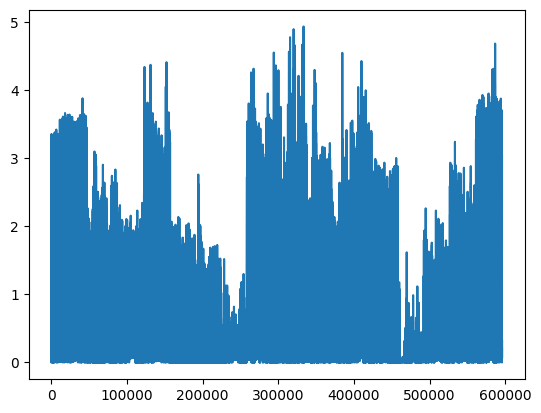

In [143]:
dff['Load (kW)'].plot()

In [97]:
scaler = MinMaxScaler(feature_range=(0,1))
df_1=scaler.fit_transform(dff)
df_scaled = pd.DataFrame(df_1,columns=dff.columns)
df_scaled

,Load (kW),block,Day
0,0.041223,0.000000,0.166667
1,0.041455,0.010526,0.166667
2,0.028994,0.021053,0.166667
3,0.028496,0.031579,0.166667
4,0.009165,0.042105,0.166667
...,...,...,...
595715,0.061995,0.957895,0.000000
595716,0.032050,0.968421,0.000000
595717,0.012360,0.978947,0.000000
595718,0.013462,0.989474,0.000000


In [103]:
X_test = df_scaled.iloc[:595720,0:3]

In [104]:
X_test

,Load (kW),block,Day
0,0.041223,0.000000,0.166667
1,0.041455,0.010526,0.166667
2,0.028994,0.021053,0.166667
3,0.028496,0.031579,0.166667
4,0.009165,0.042105,0.166667
...,...,...,...
595715,0.061995,0.957895,0.000000
595716,0.032050,0.968421,0.000000
595717,0.012360,0.978947,0.000000
595718,0.013462,0.989474,0.000000


In [106]:
X_test=X_test.to_numpy()

In [107]:
X_test  = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])

In [108]:
size = dff.shape[1]

In [111]:
size

3

In [109]:
yhat = load.predict(X_test)

18617/18617 [==============================] - 35s 2ms/step


In [116]:
yhat

array([[-0.01078443],
       [-0.00896615],
       [-0.00772893],
       ...,
       [ 0.00872447],
       [ 0.00776431],
       [ 0.00595624]], dtype=float32)

In [121]:
X_test = X_test.reshape(X_test.shape[0], X_test.shape[2])

In [122]:
inv_yhat = np.concatenate((yhat, X_test[:, 1-size:]), axis=1)
inv_yhat = scaler.inverse_transform(inv_yhat)
inv_yhat = inv_yhat[:,0]
inv_yhat.shape

(595720,)

In [130]:
inv_yhat

array([-0.05325099, -0.04427273, -0.03816366, ...,  0.04307936,
        0.03833831,  0.02941053])

In [127]:
X_test[:,0].shape

(595720,)

In [145]:
dff['Load (kW)'].iloc[:95]

0     0.203550
1     0.204695
2     0.143164
3     0.140705
4     0.045253
        ...   
90    0.110298
91    0.058984
92    0.149213
93    0.145788
94    0.049521
Name: Load (kW), Length: 95, dtype: float64

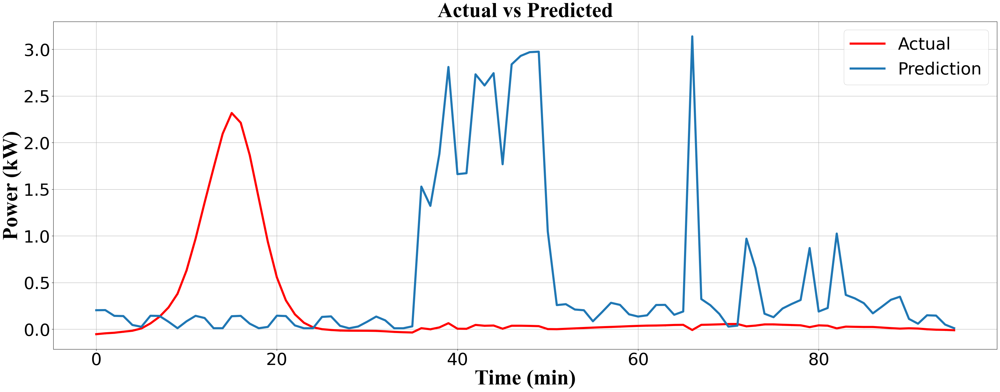

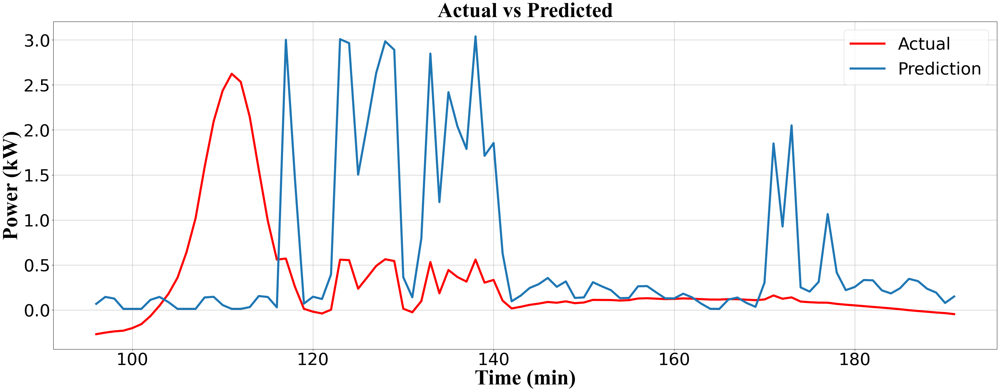

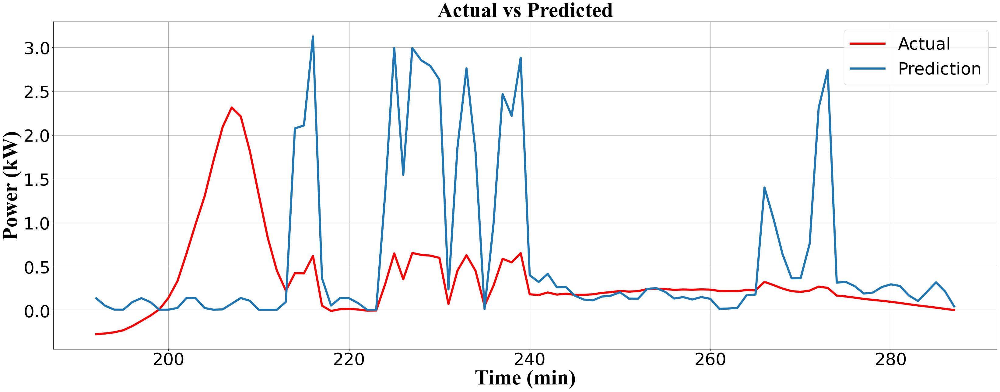

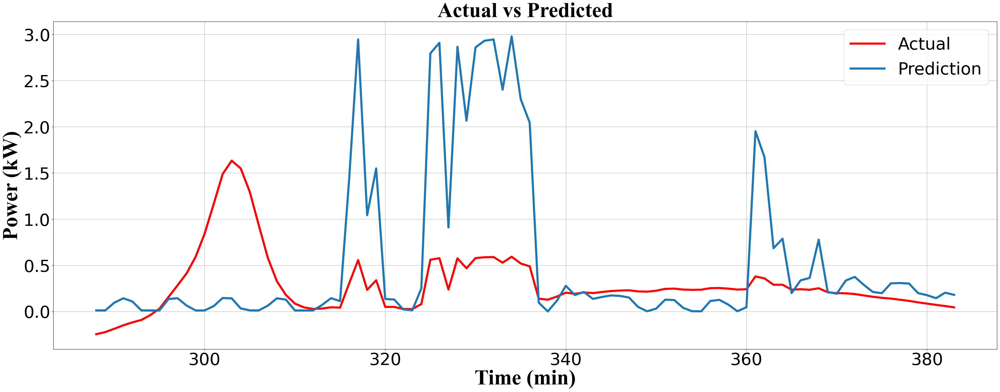

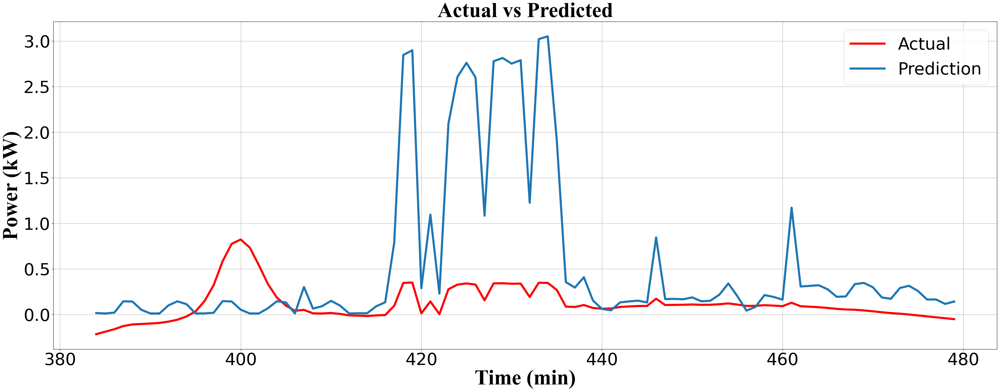

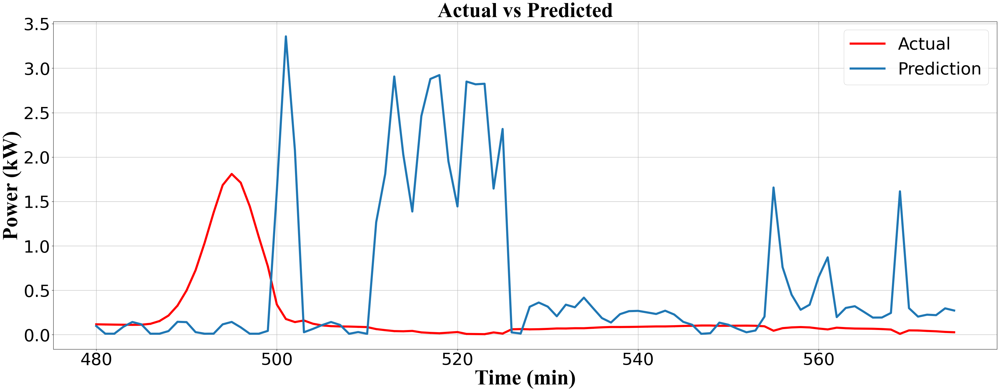

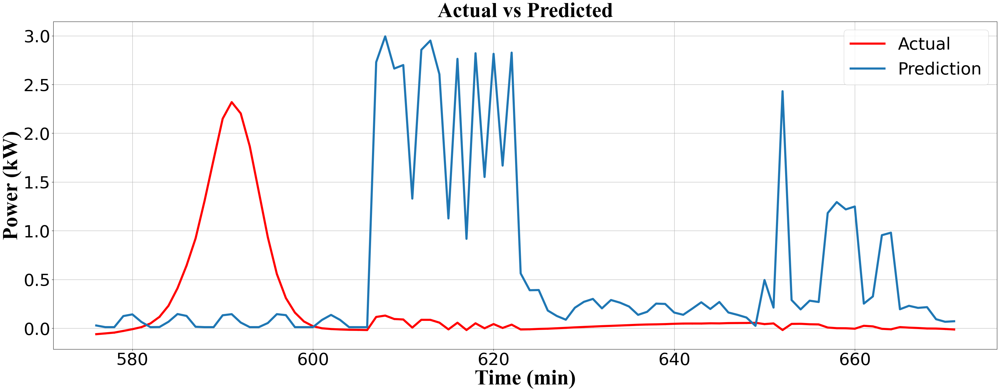

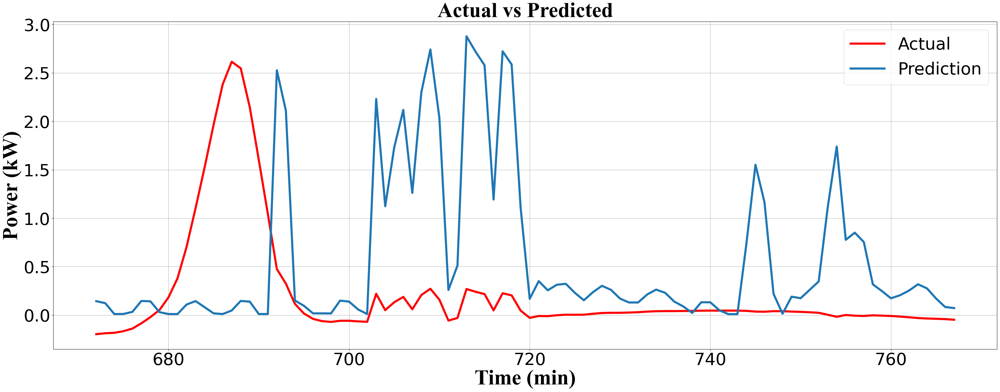

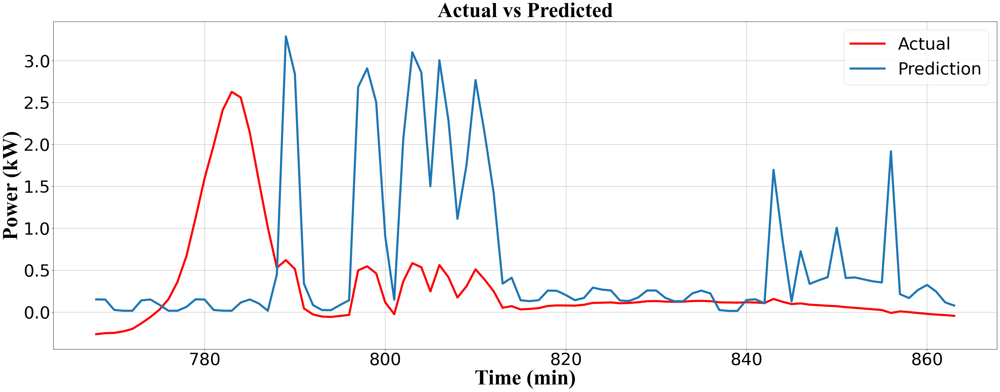

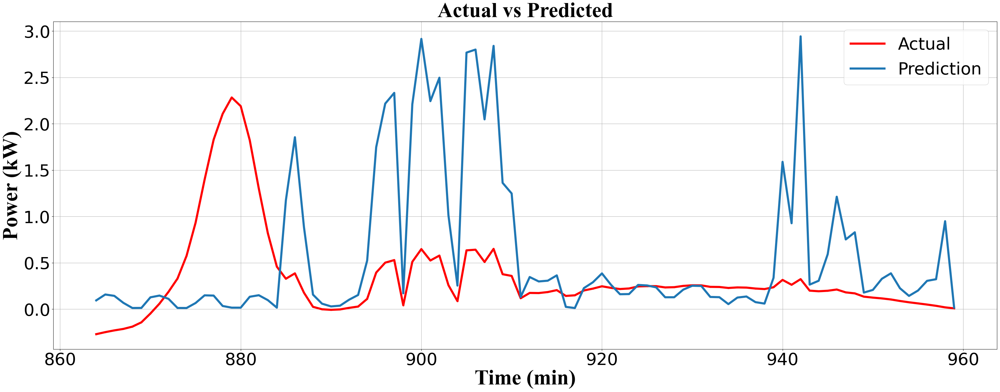

In [147]:
y=0
for i in range(96,1000,96):
    aa=[x for x in range(y,i)]
    plt.figure(figsize=(40,14)) 
    plt.plot(aa, inv_yhat[y:i],'r', marker='.', label="Actual",linewidth=5 )
    plt.plot(aa, dff['Load (kW)'].iloc[y:i], label="Prediction",linewidth=5)
    y = i
    plt.title('Actual vs Predicted', size=50,fontname="Times New Roman",fontweight="bold")
    plt.ylabel('Power (kW)', size=50,fontname="Times New Roman",fontweight="bold")
    plt.xlabel('Time (min)', size=50,fontname="Times New Roman",fontweight="bold")
    plt.legend(fontsize=40)
    plt.xticks(fontsize=40)
    plt.yticks(fontsize=40)
    plt.grid()
  #  plt.savefig('H_pred.pdf')
  #  plt.savefig('H_pred.png')
    plt.show()

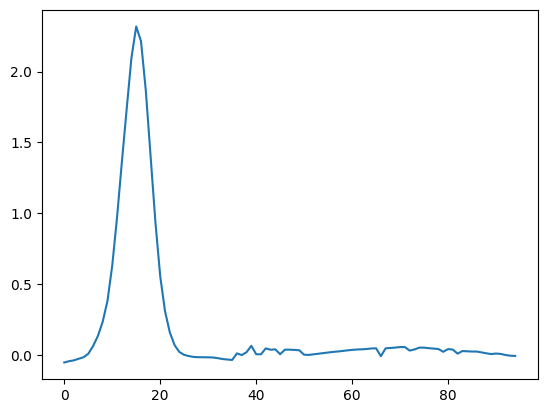

In [137]:
plt.plot(inv_yhat[:95])

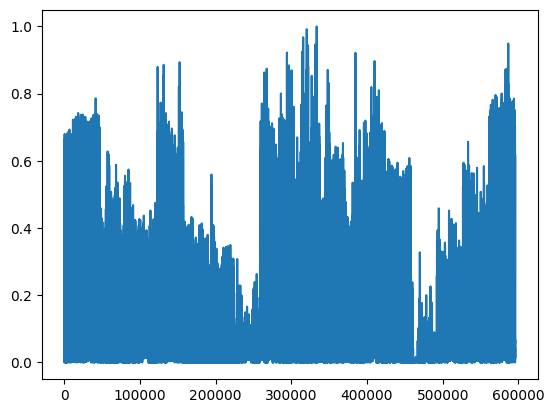

In [144]:
plt.plot(X_test[:,0])

In [1]:
df_f

NameError: name 'df_f' is not defined